In [55]:
import cv2
from IPython.display import display
from PIL import Image

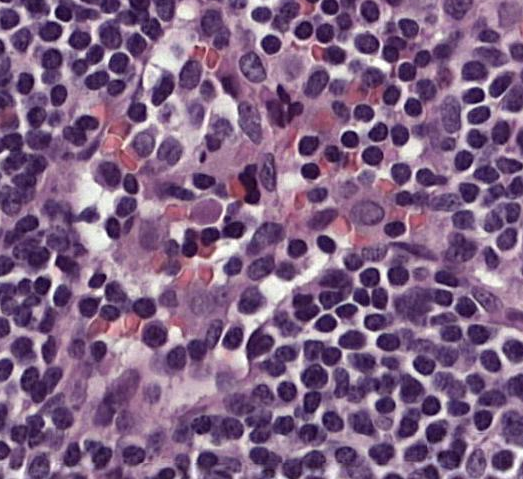

In [ ]:
image=cv2.imread("/content/2.png")
img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
display(Image.fromarray(img))

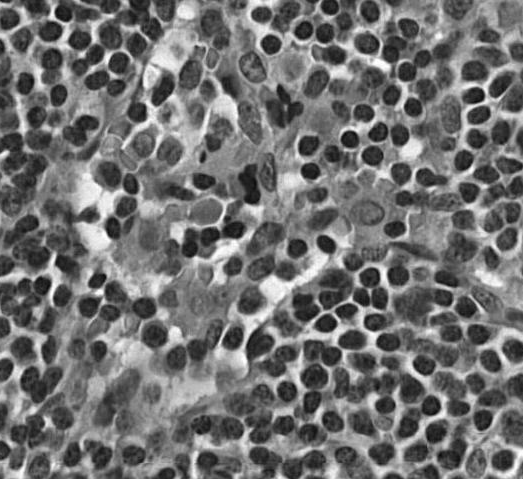

In [ ]:
def grayscale(image):
  gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  display(Image.fromarray(gray))
  return gray
gray_scale_image = grayscale(img)  

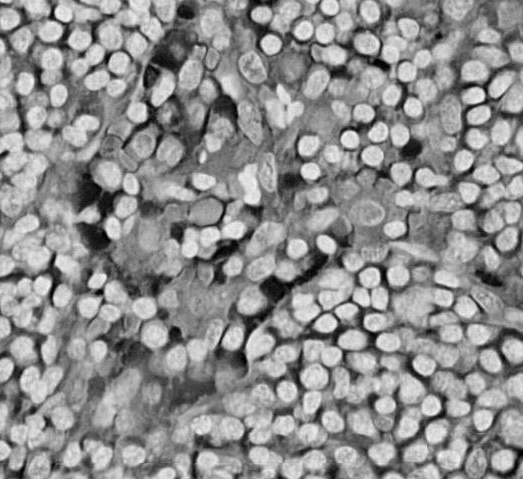

In [ ]:
def invert_grayscale(image):
  invert_grayscale = cv2.bitwise_not(image)
  display(Image.fromarray(invert_grayscale))
  return invert_grayscale

invert_grayscale_image=invert_grayscale(gray_scale_image)


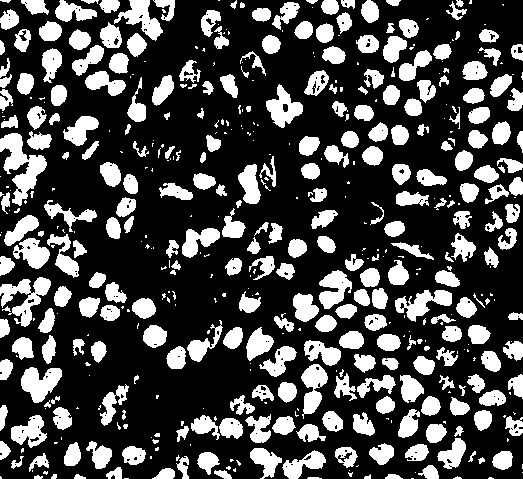

In [ ]:
def basic_threshold(image,orig):
  ret,basic_threshold=cv2.threshold(image,180,255,cv2.THRESH_BINARY)
  display(Image.fromarray(basic_threshold))
  return basic_threshold

basic_threshold_mask = basic_threshold(invert_grayscale_image,img)

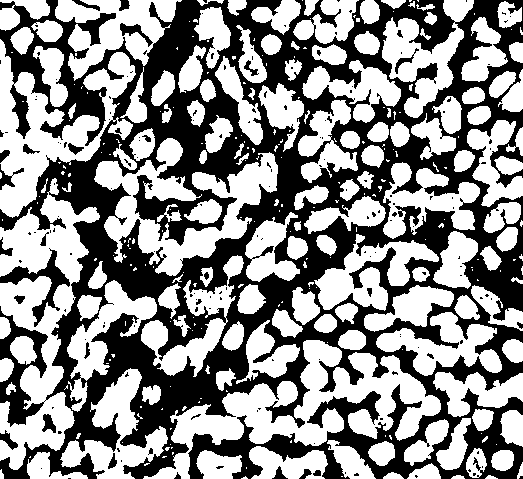

In [ ]:
def otsu_threshold(image):
  ret2,otsu_threshold=cv2.threshold(image,10,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  display(Image.fromarray(otsu_threshold))
  return otsu_threshold

otsu_threshold_image=otsu_threshold(invert_grayscale_image)

In [32]:
class Ensemble_Threshold(object):
  def __init__(self,input_image_path):
    self.input_image = cv2.imread(input_image_path)
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    display(Image.fromarray(img))
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    display(Image.fromarray(gray)) 
    invert_grayscale = cv2.bitwise_not(gray)
    display(Image.fromarray(invert_grayscale))

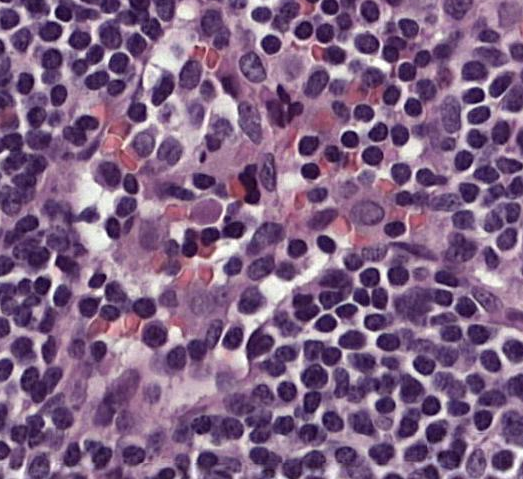

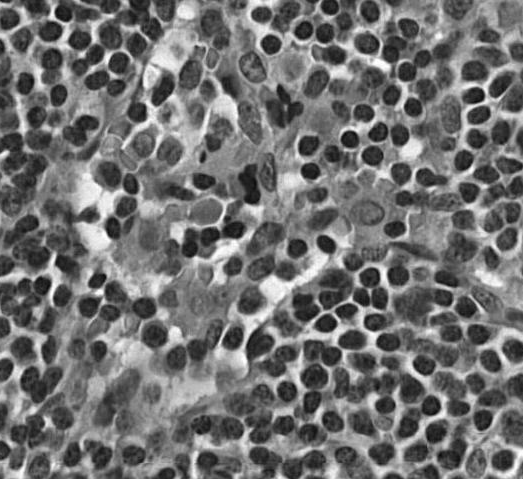

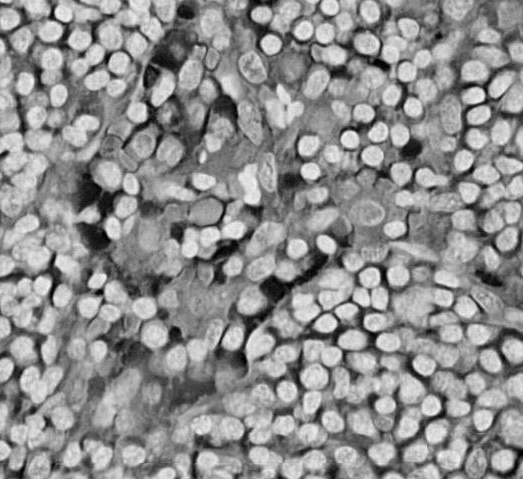

In [33]:
A = Ensemble_Threshold("/content/2.png")

In [34]:
import math
import multiprocessing
import numpy as np
import os
import scipy.ndimage.morphology as sc_morph
import skimage.color as sk_color
import skimage.exposure as sk_exposure
import skimage.feature as sk_feature
import skimage.filters as sk_filters
import skimage.future as sk_future
import skimage.morphology as sk_morphology
import skimage.segmentation as sk_segmentation

In [51]:
import datetime

In [47]:
class Time:
  """
  Class for displaying elapsed time.
  """

  def __init__(self):
    self.start = datetime.datetime.now()

  def elapsed_display(self):
    time_elapsed = self.elapsed()
    print("Time elapsed: " + str(time_elapsed))

  def elapsed(self):
    self.end = datetime.datetime.now()
    time_elapsed = self.end - self.start
    return time_elapsed

In [56]:
def filter_rgb_to_grayscale(np_img, output_type="uint8"):
  """
  Convert an RGB NumPy array to a grayscale NumPy array.
  Shape (h, w, c) to (h, w).
  Args:
    np_img: RGB Image as a NumPy array.
    output_type: Type of array to return (float or uint8)
  Returns:
    Grayscale image as NumPy array with shape (h, w).
  """
  t = Time()
  # Another common RGB ratio possibility: [0.299, 0.587, 0.114]
  grayscale = np.dot(np_img[..., :3], [0.2125, 0.7154, 0.0721])
  if output_type != "float":
    grayscale = grayscale.astype("uint8")
  np_info(grayscale, "Gray", t.elapsed())
  display(Image.fromarray(grayscale))
  return grayscale

In [53]:
ADDITIONAL_NP_STATS = False

In [49]:
def np_info(np_arr, name=None, elapsed=None):
  """
  Display information (shape, type, max, min, etc) about a NumPy array.
  Args:
    np_arr: The NumPy array.
    name: The (optional) name of the array.
    elapsed: The (optional) time elapsed to perform a filtering operation.
  """

  if name is None:
    name = "NumPy Array"
  if elapsed is None:
    elapsed = "---"

  if ADDITIONAL_NP_STATS is False:
    print("%-20s | Time: %-14s  Type: %-7s Shape: %s" % (name, str(elapsed), np_arr.dtype, np_arr.shape))
  else:
    # np_arr = np.asarray(np_arr)
    max = np_arr.max()
    min = np_arr.min()
    mean = np_arr.mean()
    is_binary = "T" if (np.unique(np_arr).size == 2) else "F"
    print("%-20s | Time: %-14s Min: %6.2f  Max: %6.2f  Mean: %6.2f  Binary: %s  Type: %-7s Shape: %s" % (
      name, str(elapsed), min, max, mean, is_binary, np_arr.dtype, np_arr.shape))

In [37]:
image=cv2.imread("/content/2.png")

In [38]:
import numpy as np
from PIL import Image

In [39]:
img = Image.open('/content/2.png')
array = np.array(img)
print(array.shape) 

(479, 523, 3)


Gray                 | Time: 0:00:00.011239  Type: uint8   Shape: (479, 523)


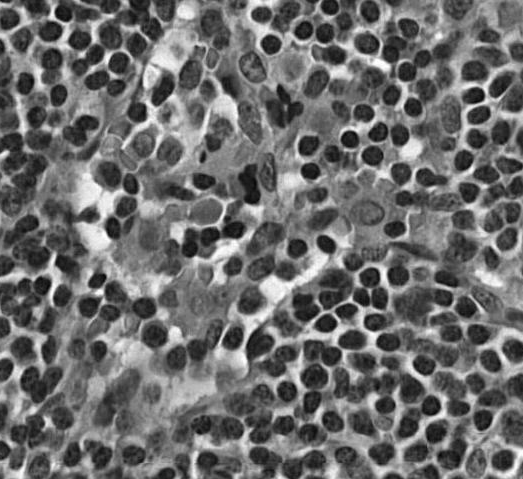

array([[ 47,  23,  24, ..., 154, 149, 154],
       [ 96,  73,  39, ..., 153, 151, 158],
       [154, 136, 105, ..., 153, 154, 156],
       ...,
       [ 68,  74,  80, ..., 121, 130, 123],
       [ 59,  68,  78, ..., 134, 147, 128],
       [ 53,  61,  79, ..., 142, 158, 124]], dtype=uint8)

In [57]:
filter_rgb_to_grayscale(array)

In [61]:
def filter_complement(np_img, output_type="uint8"):
  """
  Obtain the complement of an image as a NumPy array.
  Args:
    np_img: Image as a NumPy array.
    type: Type of array to return (float or uint8).
  Returns:
    Complement image as Numpy array.
  """
  t = Time()
  if output_type == "float":
    complement = 1.0 - np_img
  else:
    complement = 255 - np_img
  np_info(complement, "Complement", t.elapsed())
  display(Image.fromarray(complement))
  return complement

Complement           | Time: 0:00:00.000385  Type: uint8   Shape: (479, 523, 3)


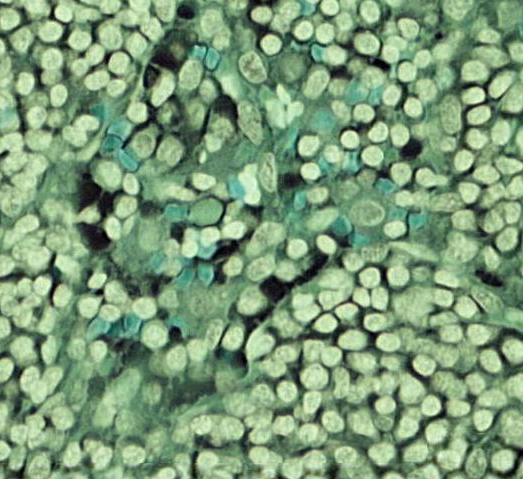

array([[[189, 216, 183],
        [213, 240, 205],
        [211, 239, 201],
        ...,
        [ 77, 109,  88],
        [ 84, 113,  93],
        [ 79, 108,  86]],

       [[140, 166, 139],
        [163, 189, 162],
        [196, 223, 192],
        ...,
        [ 80, 109,  89],
        [ 82, 111,  91],
        [ 75, 105,  81]],

       [[ 83, 107,  85],
        [101, 125, 103],
        [132, 156, 130],
        ...,
        [ 78, 110,  89],
        [ 77, 109,  86],
        [ 77, 107,  81]],

       ...,

       [[166, 196, 158],
        [159, 189, 153],
        [153, 183, 149],
        ...,
        [119, 141, 102],
        [108, 133,  91],
        [112, 141,  95]],

       [[174, 204, 168],
        [168, 195, 160],
        [158, 185, 152],
        ...,
        [106, 128,  90],
        [ 91, 116,  76],
        [107, 136,  92]],

       [[183, 210, 175],
        [175, 202, 167],
        [157, 184, 151],
        ...,
        [ 98, 120,  84],
        [ 80, 105,  66],
        [111, 140,  96]]

In [62]:
filter_complement(array)

In [71]:
def filter_hysteresis_threshold(np_img, low=60, high=150, output_type="uint8"):
  """
  Apply two-level (hysteresis) threshold to an image as a NumPy array, returning a binary image.
  Args:
    np_img: Image as a NumPy array.
    low: Low threshold.
    high: High threshold.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where True, 1.0, and 255 represent a pixel above hysteresis threshold.
  """
  t = Time()
  hyst = sk_filters.apply_hysteresis_threshold(np_img, low, high)
  if output_type == "bool":
    pass
  elif output_type == "float":
    hyst = hyst.astype(float)
  else:
    hyst = (255 * hyst).astype("uint8")
  np_info(hyst, "Hysteresis Threshold", t.elapsed())
  display(Image.fromarray(hyst))
  return hyst

Hysteresis Threshold | Time: 0:00:00.054704  Type: uint8   Shape: (479, 523, 3)


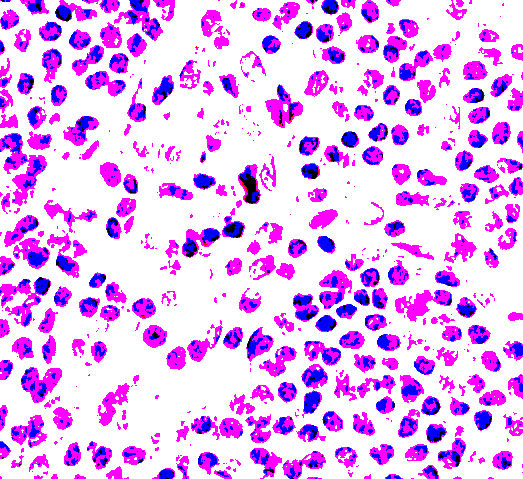

In [76]:
a =filter_hysteresis_threshold(array)

In [74]:
def filter_otsu_threshold(np_img, output_type="uint8"):
  """
  Compute Otsu threshold on image as a NumPy array and return binary image based on pixels above threshold.
  Args:
    np_img: Image as a NumPy array.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where True, 1.0, and 255 represent a pixel above Otsu threshold.
  """
  t = Time()
  otsu_thresh_value = sk_filters.threshold_otsu(np_img)
  otsu = (np_img > otsu_thresh_value)
  if output_type == "bool":
    pass
  elif output_type == "float":
    otsu = otsu.astype(float)
  else:
    otsu = otsu.astype("uint8") * 255
  np_info(otsu, "Otsu Threshold", t.elapsed())
  display(Image.fromarray(otsu))
  return otsu

Otsu Threshold       | Time: 0:00:00.007969  Type: uint8   Shape: (479, 523, 3)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: UserWarning: threshold_otsu is expected to work correctly only for grayscale images; image shape (479, 523, 3) looks like an RGB image
  # This is added back by InteractiveShellApp.init_path()


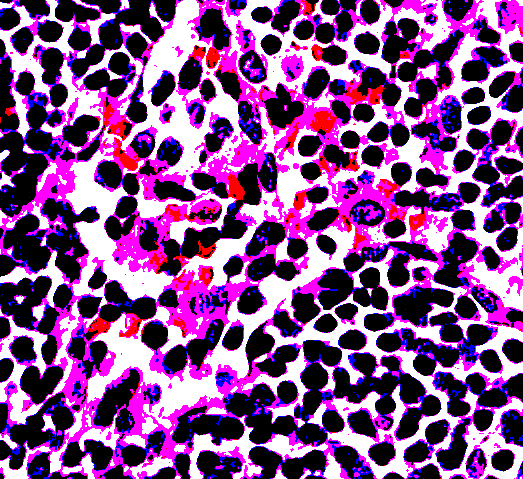

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [  0,   0, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255,   0, 255],
        [255,   0, 255],
        [255,   0, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255,   0, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255,   0, 255]]

In [78]:
filter_otsu_threshold(array)

In [79]:
def filter_local_otsu_threshold(np_img, disk_size=3, output_type="uint8"):
  """
  Compute local Otsu threshold for each pixel and return binary image based on pixels being less than the
  local Otsu threshold.
  Args:
    np_img: Image as a NumPy array.
    disk_size: Radius of the disk structuring element used to compute the Otsu threshold for each pixel.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where local Otsu threshold values have been applied to original image.
  """
  t = Time()
  local_otsu = sk_filters.rank.otsu(np_img, sk_morphology.disk(disk_size))
  if output_type == "bool":
    pass
  elif output_type == "float":
    local_otsu = local_otsu.astype(float)
  else:
    local_otsu = local_otsu.astype("uint8") * 255
  np_info(local_otsu, "Otsu Local Threshold", t.elapsed())
  display(Image.fromarray(local_otsu))
  return local_otsu

Gray                 | Time: 0:00:00.018943  Type: uint8   Shape: (479, 523)


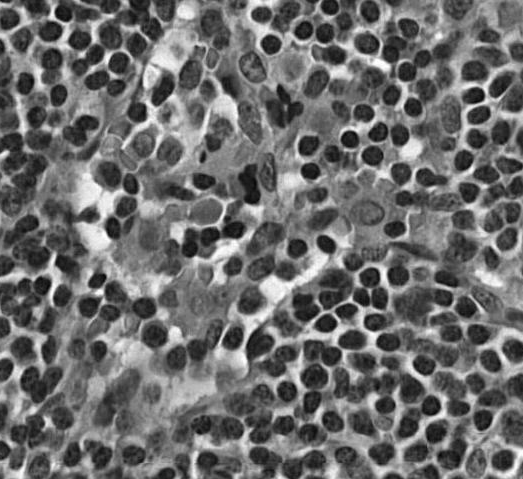

In [82]:
b=filter_rgb_to_grayscale(array)

Otsu Local Threshold | Time: 0:00:00.211919  Type: uint8   Shape: (479, 523)


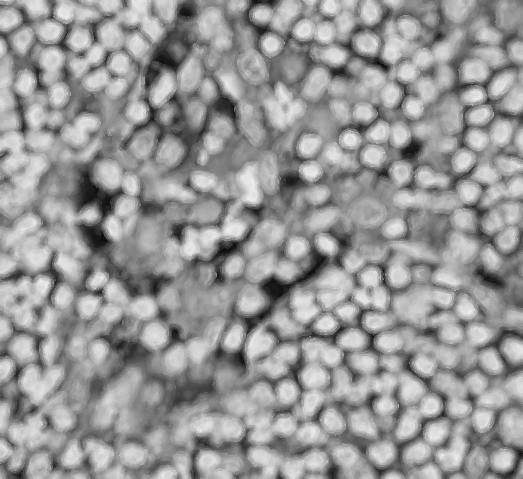

array([[183, 183, 183, ..., 120, 102, 102],
       [151, 151, 151, ..., 113, 105, 107],
       [151, 151, 151, ..., 113, 113, 107],
       ...,
       [182, 174, 158, ..., 140, 143, 147],
       [188, 176, 158, ..., 140, 140, 143],
       [176, 176, 152, ..., 140, 132, 122]], dtype=uint8)

In [83]:
filter_local_otsu_threshold(b)

In [103]:
def filter_entropy(np_img, neighborhood=9, threshold=5, output_type="uint8"):
  """
  Filter image based on entropy (complexity).
  Args:
    np_img: Image as a NumPy array.
    neighborhood: Neighborhood size (defines height and width of 2D array of 1's).
    threshold: Threshold value.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where True, 1.0, and 255 represent a measure of complexity.
  """
  t = Time()
  entr = sk_filters.rank.entropy(np_img, np.ones((neighborhood, neighborhood))) > threshold
  if output_type == "bool":
    pass
  elif output_type == "float":
    entr = entr.astype(float)
  else:
    entr = entr.astype("uint8") * 255
  np_info(entr, "Entropy", t.elapsed())
  display(Image.fromarray(entr))
  return entr

Entropy              | Time: 0:00:00.797256  Type: uint8   Shape: (479, 523)


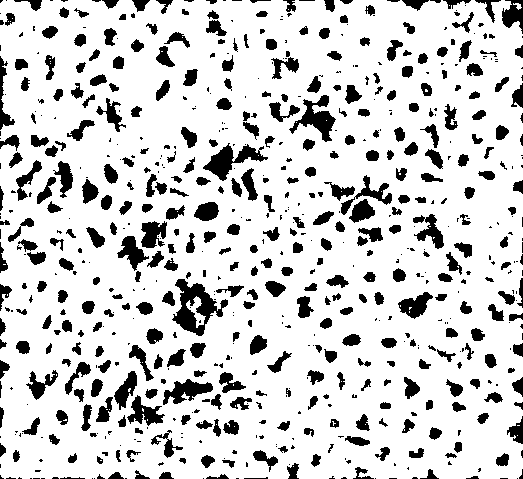

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0, 255, ...,   0,   0,   0],
       [  0, 255, 255, ...,   0,   0,   0],
       ...,
       [  0, 255, 255, ...,   0,   0,   0],
       [  0,   0, 255, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [104]:
filter_entropy(b)

In [106]:
def filter_canny(np_img, sigma=1, low_threshold=0, high_threshold=25, output_type="uint8"):
  """
  Filter image based on Canny algorithm edges.
  Args:
    np_img: Image as a NumPy array.
    sigma: Width (std dev) of Gaussian.
    low_threshold: Low hysteresis threshold value.
    high_threshold: High hysteresis threshold value.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) representing Canny edge map (binary image).
  """
  t = Time()
  can = sk_feature.canny(np_img, sigma=sigma, low_threshold=low_threshold, high_threshold=high_threshold)
  if output_type == "bool":
    pass
  elif output_type == "float":
    can = can.astype(float)
  else:
    can = can.astype("uint8") * 255
  np_info(can, "Canny Edges", t.elapsed())
  display(Image.fromarray(can))
  return can

Canny Edges          | Time: 0:00:00.112442  Type: uint8   Shape: (479, 523)


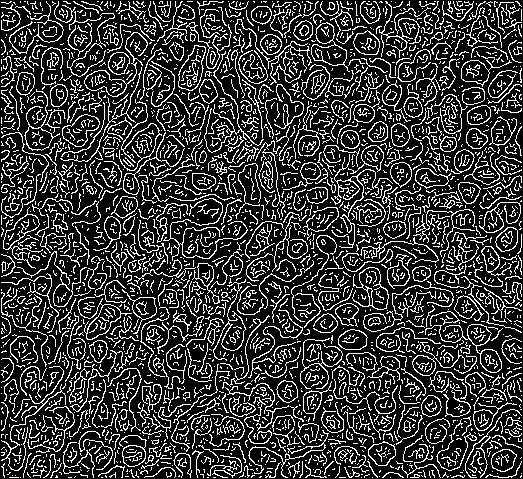

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0, 255, 255, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 255, 255,   0],
       [  0,   0,   0, ..., 255,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [109]:
filter_canny(b)

In [110]:
def mask_percent(np_img):
  """
  Determine the percentage of a NumPy array that is masked (how many of the values are 0 values).
  Args:
    np_img: Image as a NumPy array.
  Returns:
    The percentage of the NumPy array that is masked.
  """
  if (len(np_img.shape) == 3) and (np_img.shape[2] == 3):
    np_sum = np_img[:, :, 0] + np_img[:, :, 1] + np_img[:, :, 2]
    mask_percentage = 100 - np.count_nonzero(np_sum) / np_sum.size * 100
  else:
    mask_percentage = 100 - np.count_nonzero(np_img) / np_img.size * 100
  return mask_percentage

In [111]:
mask_percent(array)

0.40675882275454

In [112]:
def tissue_percent(np_img):
  """
  Determine the percentage of a NumPy array that is tissue (not masked).
  Args:
    np_img: Image as a NumPy array.
  Returns:
    The percentage of the NumPy array that is tissue.
  """
  return 100 - mask_percent(np_img)

In [122]:
tissue_percent(array)

99.59324117724546

In [123]:
def filter_contrast_stretch(np_img, low=40, high=60):
  """
  Filter image (gray or RGB) using contrast stretching to increase contrast in image based on the intensities in
  a specified range.
  Args:
    np_img: Image as a NumPy array (gray or RGB).
    low: Range low value (0 to 255).
    high: Range high value (0 to 255).
  Returns:
    Image as NumPy array with contrast enhanced.
  """
  t = Time()
  low_p, high_p = np.percentile(np_img, (low * 100 / 255, high * 100 / 255))
  contrast_stretch = sk_exposure.rescale_intensity(np_img, in_range=(low_p, high_p))
  np_info(contrast_stretch, "Contrast Stretch", t.elapsed())
  display(Image.fromarray(contrast_stretch))
  return contrast_stretch

Contrast Stretch     | Time: 0:00:00.019418  Type: uint8   Shape: (479, 523, 3)


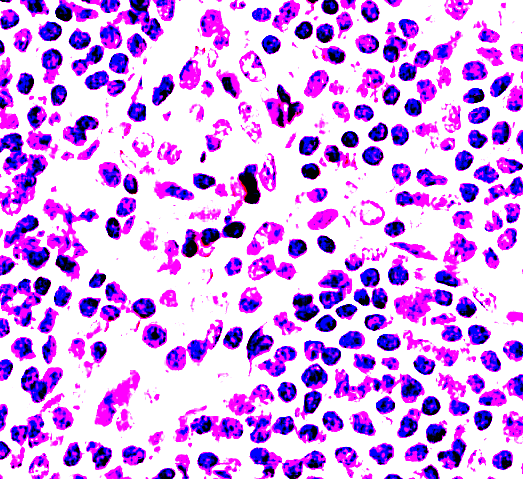

array([[[  0,   0, 117],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255,   0, 255],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255,   0, 255],
        [255,   0, 255],
        [255, 117, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255,   0, 255],
        [255,   0, 255],
        [255,  78, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[117,   0, 255],
        [255,   0, 255],
        [255,  98, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [124]:
filter_contrast_stretch(array)

In [125]:
def filter_histogram_equalization(np_img, nbins=256, output_type="uint8"):
  """
  Filter image (gray or RGB) using histogram equalization to increase contrast in image.
  Args:
    np_img: Image as a NumPy array (gray or RGB).
    nbins: Number of histogram bins.
    output_type: Type of array to return (float or uint8).
  Returns:
     NumPy array (float or uint8) with contrast enhanced by histogram equalization.
  """
  t = Time()
  # if uint8 type and nbins is specified, convert to float so that nbins can be a value besides 256
  if np_img.dtype == "uint8" and nbins != 256:
    np_img = np_img / 255
  hist_equ = sk_exposure.equalize_hist(np_img, nbins=nbins)
  if output_type == "float":
    pass
  else:
    hist_equ = (hist_equ * 255).astype("uint8")
  np_info(hist_equ, "Hist Equalization", t.elapsed())
  display(Image.fromarray(hist_equ))
  return hist_equ

Hist Equalization    | Time: 0:00:00.057620  Type: uint8   Shape: (479, 523, 3)


/usr/local/lib/python3.6/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


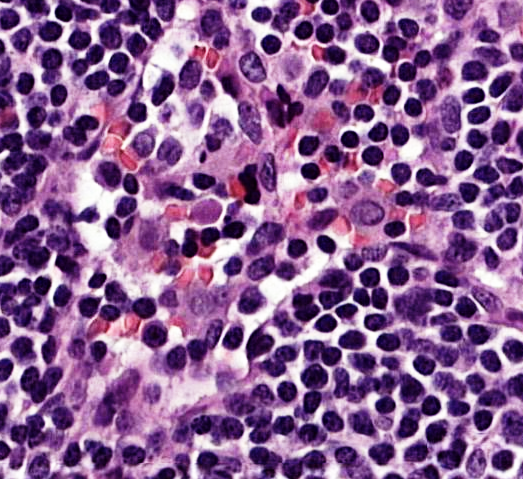

array([[[ 40,  12,  49],
        [ 14,   0,  21],
        [ 16,   0,  25],
        ...,
        [215, 171, 202],
        [207, 164, 195],
        [213, 172, 204]],

       [[121,  78, 123],
        [ 83,  40,  85],
        [ 31,   7,  36],
        ...,
        [211, 171, 200],
        [209, 167, 198],
        [217, 177, 210]],

       [[208, 174, 206],
        [183, 145, 180],
        [134,  95, 137],
        ...,
        [214, 169, 200],
        [215, 171, 204],
        [215, 174, 210]],

       ...,

       [[ 78,  31,  91],
        [ 90,  40, 100],
        [100,  49, 107],
        ...,
        [155, 120, 182],
        [172, 132, 198],
        [166, 120, 192]],

       [[ 64,  22,  74],
        [ 74,  32,  88],
        [ 91,  46, 102],
        ...,
        [175, 140, 199],
        [198, 159, 216],
        [174, 128, 196]],

       [[ 49,  17,  62],
        [ 62,  24,  76],
        [ 93,  48, 103],
        ...,
        [188, 153, 207],
        [211, 177, 226],
        [167, 121, 191]]

In [127]:
filter_histogram_equalization(array)

In [128]:
def filter_adaptive_equalization(np_img, nbins=256, clip_limit=0.01, output_type="uint8"):
  """
  Filter image (gray or RGB) using adaptive equalization to increase contrast in image, where contrast in local regions
  is enhanced.
  Args:
    np_img: Image as a NumPy array (gray or RGB).
    nbins: Number of histogram bins.
    clip_limit: Clipping limit where higher value increases contrast.
    output_type: Type of array to return (float or uint8).
  Returns:
     NumPy array (float or uint8) with contrast enhanced by adaptive equalization.
  """
  t = Time()
  adapt_equ = sk_exposure.equalize_adapthist(np_img, nbins=nbins, clip_limit=clip_limit)
  if output_type == "float":
    pass
  else:
    adapt_equ = (adapt_equ * 255).astype("uint8")
  np_info(adapt_equ, "Adapt Equalization", t.elapsed())
  display(Image.fromarray(adapt_equ))
  return adapt_equ

Adapt Equalization   | Time: 0:00:00.196564  Type: uint8   Shape: (479, 523, 3)


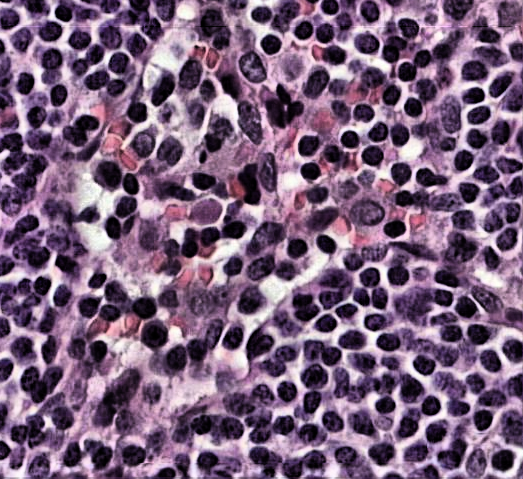

array([[[ 24,  14,  27],
        [  1,   0,   1],
        [  2,   0,   2],
        ...,
        [195, 160, 183],
        [179, 149, 170],
        [165, 138, 158]],

       [[116,  90, 117],
        [ 73,  52,  74],
        [  9,   5,   9],
        ...,
        [188, 156, 178],
        [183, 152, 174],
        [169, 141, 164]],

       [[195, 168, 193],
        [173, 146, 171],
        [128, 103, 130],
        ...,
        [192, 157, 180],
        [195, 160, 185],
        [167, 139, 163]],

       ...,

       [[ 63,  42,  69],
        [ 76,  52,  81],
        [ 86,  61,  89],
        ...,
        [119,  99, 134],
        [138, 114, 154],
        [131, 104, 147]],

       [[ 60,  37,  64],
        [ 67,  46,  73],
        [ 77,  56,  82],
        ...,
        [138, 117, 152],
        [154, 131, 168],
        [136, 110, 150]],

       [[ 50,  31,  56],
        [ 59,  39,  65],
        [ 78,  57,  83],
        ...,
        [146, 126, 159],
        [166, 142, 180],
        [132, 105, 146]]

In [129]:
filter_adaptive_equalization(array)

In [131]:
def filter_local_equalization(np_img, disk_size=50):
  """
  Filter image (gray) using local equalization, which uses local histograms based on the disk structuring element.
  Args:
    np_img: Image as a NumPy array.
    disk_size: Radius of the disk structuring element used for the local histograms
  Returns:
    NumPy array with contrast enhanced using local equalization.
  """
  t = Time()
  local_equ = sk_filters.rank.equalize(np_img, selem=sk_morphology.disk(disk_size))
  np_info(local_equ, "Local Equalization", t.elapsed())
  display(Image.fromarray(local_equ))
  return local_equ

Local Equalization   | Time: 0:00:00.165261  Type: uint8   Shape: (479, 523)


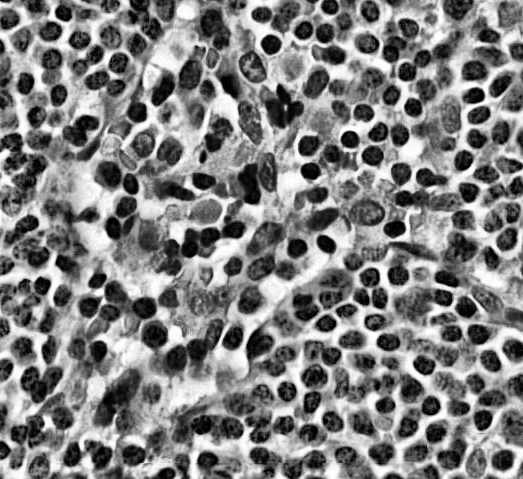

array([[ 50,   1,   3, ..., 197, 186, 195],
       [141, 109,  31, ..., 195, 190, 205],
       [205, 187, 151, ..., 196, 197, 200],
       ...,
       [ 80,  93, 108, ..., 134, 144, 135],
       [ 55,  79, 101, ..., 148, 163, 141],
       [ 40,  59, 102, ..., 159, 177, 136]], dtype=uint8)

In [133]:
filter_local_equalization(b)

In [134]:
def filter_rgb_to_hed(np_img, output_type="uint8"):
  """
  Filter RGB channels to HED (Hematoxylin - Eosin - Diaminobenzidine) channels.
  Args:
    np_img: RGB image as a NumPy array.
    output_type: Type of array to return (float or uint8).
  Returns:
    NumPy array (float or uint8) with HED channels.
  """
  t = Time()
  hed = sk_color.rgb2hed(np_img)
  if output_type == "float":
    hed = sk_exposure.rescale_intensity(hed, out_range=(0.0, 1.0))
  else:
    hed = (sk_exposure.rescale_intensity(hed, out_range=(0, 255))).astype("uint8")

  np_info(hed, "RGB to HED", t.elapsed())
  display(Image.fromarray(hed))
  return hed

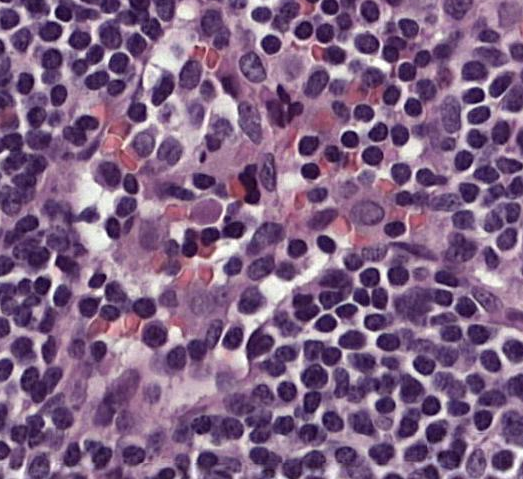

In [136]:
display(Image.fromarray(array))

RGB to HED           | Time: 0:00:00.042857  Type: uint8   Shape: (479, 523, 3)


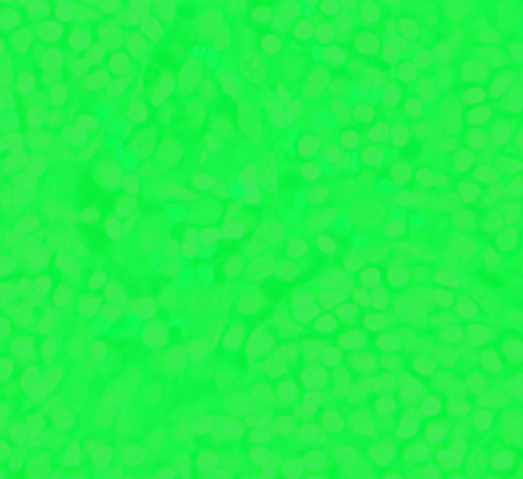

array([[[ 52, 236,  86],
        [ 60, 235,  90],
        [ 60, 235,  89],
        ...,
        [ 21, 243,  70],
        [ 23, 242,  71],
        [ 22, 243,  69]],

       [[ 38, 239,  78],
        [ 44, 237,  82],
        [ 54, 236,  88],
        ...,
        [ 22, 242,  70],
        [ 22, 242,  70],
        [ 21, 243,  68]],

       [[ 23, 242,  68],
        [ 28, 241,  72],
        [ 36, 239,  76],
        ...,
        [ 21, 243,  70],
        [ 21, 243,  69],
        [ 21, 243,  68]],

       ...,

       [[ 46, 239,  80],
        [ 44, 239,  80],
        [ 42, 239,  79],
        ...,
        [ 35, 241,  69],
        [ 32, 242,  67],
        [ 33, 243,  67]],

       [[ 48, 238,  83],
        [ 47, 238,  81],
        [ 44, 238,  80],
        ...,
        [ 31, 242,  67],
        [ 27, 243,  64],
        [ 31, 243,  67]],

       [[ 51, 237,  84],
        [ 49, 237,  82],
        [ 43, 238,  79],
        ...,
        [ 29, 242,  66],
        [ 24, 244,  63],
        [ 32, 243,  68]]

In [137]:
filter_rgb_to_hed(array)

In [140]:
import matplotlib.pyplot as plt


In [145]:
def filter_rgb_to_hsv(np_img, display_np_info=True):
  """
  Filter RGB channels to HSV (Hue, Saturation, Value).
  Args:
    np_img: RGB image as a NumPy array.
    display_np_info: If True, display NumPy array info and filter time.
  Returns:
    Image as NumPy array in HSV representation.
  """

  if display_np_info:
    t = Time()
  hsv = sk_color.rgb2hsv(np_img)
  if display_np_info:
    np_info(hsv, "RGB to HSV", t.elapsed())
    plt.figure(figsize=(10,10))
    plt.imshow(hsv)
  return hsv

RGB to HSV           | Time: 0:00:00.073891  Type: float64 Shape: (479, 523, 3)


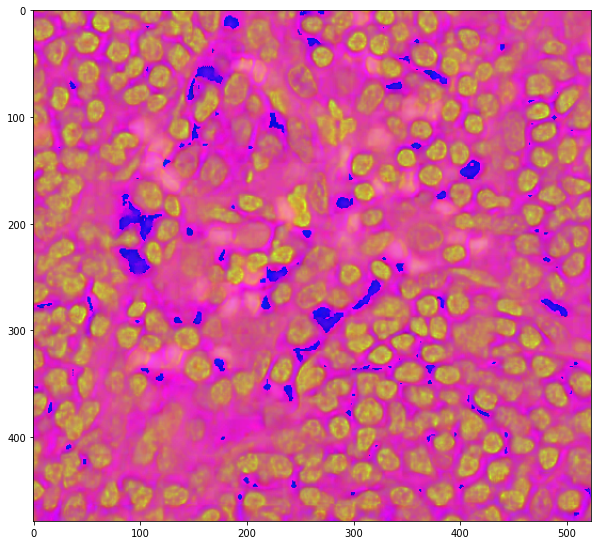

In [147]:
d =filter_rgb_to_hsv(array)

In [152]:
def filter_hed_to_hematoxylin(np_img, output_type="uint8"):
  """
  Obtain Hematoxylin channel from HED NumPy array and rescale it (for example, to 0 to 255 for uint8) for increased
  contrast.
  Args:
    np_img: HED image as a NumPy array.
    output_type: Type of array to return (float or uint8).
  Returns:
    NumPy array for Hematoxylin channel.
  """
  t = Time()
  hema = np_img[:, :, 0]
  if output_type == "float":
    hema = sk_exposure.rescale_intensity(hema, out_range=(0.0, 1.0))
  else:
    hema = (sk_exposure.rescale_intensity(hema, out_range=(0, 255))).astype("uint8")
  np_info(hema, "HED to Hematoxylin", t.elapsed())
  display(Image.fromarray(hema))
  return hema

HED to Hematoxylin   | Time: 0:00:00.005818  Type: uint8   Shape: (479, 523)


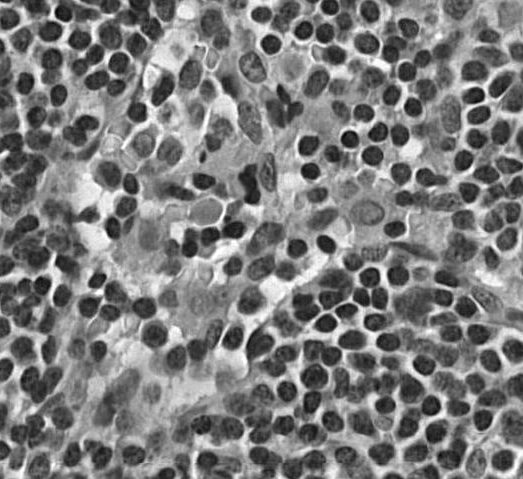

array([[ 57,  32,  34, ..., 174, 167, 172],
       [108,  84,  50, ..., 171, 169, 176],
       [168, 149, 117, ..., 173, 174, 174],
       ...,
       [ 81,  88,  95, ..., 130, 142, 137],
       [ 73,  79,  89, ..., 144, 159, 143],
       [ 63,  72,  90, ..., 152, 171, 138]], dtype=uint8)

In [153]:
filter_hed_to_hematoxylin(array)

In [154]:
def filter_hed_to_eosin(np_img, output_type="uint8"):
  """
  Obtain Eosin channel from HED NumPy array and rescale it (for example, to 0 to 255 for uint8) for increased
  contrast.
  Args:
    np_img: HED image as a NumPy array.
    output_type: Type of array to return (float or uint8).
  Returns:
    NumPy array for Eosin channel.
  """
  t = Time()
  eosin = np_img[:, :, 1]
  if output_type == "float":
    eosin = sk_exposure.rescale_intensity(eosin, out_range=(0.0, 1.0))
  else:
    eosin = (sk_exposure.rescale_intensity(eosin, out_range=(0, 255))).astype("uint8")
  np_info(eosin, "HED to Eosin", t.elapsed())
  display(Image.fromarray(eosin))
  return eosin

HED to Eosin         | Time: 0:00:00.008079  Type: uint8   Shape: (479, 523)


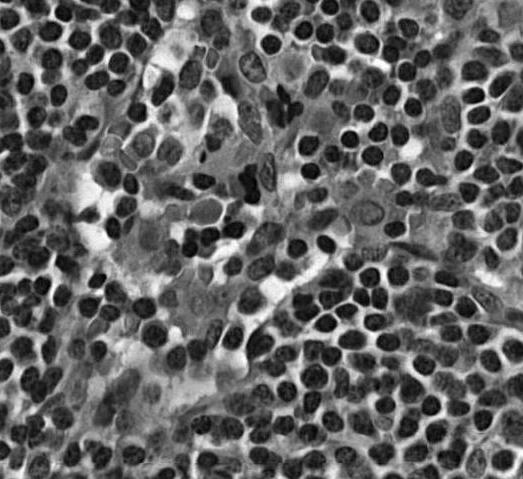

array([[ 39,  15,  16, ..., 146, 142, 147],
       [ 89,  66,  32, ..., 146, 144, 150],
       [148, 130,  99, ..., 145, 146, 148],
       ...,
       [ 59,  66,  72, ..., 114, 122, 114],
       [ 51,  60,  70, ..., 127, 139, 119],
       [ 45,  53,  71, ..., 135, 150, 115]], dtype=uint8)

In [155]:
filter_hed_to_eosin(array)

In [161]:
def filter_binary_fill_holes(np_img, output_type="bool"):
  """
  Fill holes in a binary object (bool, float, or uint8).
  Args:
    np_img: Binary image as a NumPy array.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where holes have been filled.
  """
  t = Time()
  if np_img.dtype == "uint8":
    np_img = np_img / 255
  result = sc_morph.binary_fill_holes(np_img)
  if output_type == "bool":
    pass
  elif output_type == "float":
    result = result.astype(float)
  else:
    result = result.astype("uint8") * 255
  np_info(result, "Binary Fill Holes", t.elapsed())
  
  return result

In [178]:
filter_binary_fill_holes(array)

Binary Fill Holes    | Time: 0:00:00.021529  Type: bool    Shape: (479, 523, 3)


array([[[ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True],
        ...,
        [ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True]],

       [[ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True],
        ...,
        [ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True]],

       [[ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True],
        ...,
        [ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True]],

       ...,

       [[ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True],
        ...,
        [ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True]],

       [[ True,  True,  True],
        [ True,  True,  True],
        [ True,  True,  True],
        ...,
        [ True,  True,  True],
        [ True,  True,  True],
        [ True,

In [170]:
def filter_binary_erosion(np_img, disk_size=5, iterations=1, output_type="uint8"):
  """
  Erode a binary object (bool, float, or uint8).
  Args:
    np_img: Binary image as a NumPy array.
    disk_size: Radius of the disk structuring element used for erosion.
    iterations: How many times to repeat the erosion.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array (bool, float, or uint8) where edges have been eroded.
  """
  t = Time()
  if np_img.dtype == "uint8":
    np_img = np_img / 255
  result = sc_morph.binary_erosion(np_img, sk_morphology.disk(disk_size), iterations=iterations)
  if output_type == "bool":
    pass
  elif output_type == "float":
    result = result.astype(float)
  else:
    result = result.astype("uint8") * 255
  np_info(result, "Binary Erosion", t.elapsed())
  
  return result

In [216]:
filter_binary_erosion(b)

Binary Erosion       | Time: 0:00:00.034853  Type: uint8   Shape: (479, 523)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [179]:
def filter_kmeans_segmentation(np_img, compactness=10, n_segments=800):
  """
  Use K-means segmentation (color/space proximity) to segment RGB image where each segment is
  colored based on the average color for that segment.
  Args:
    np_img: Binary image as a NumPy array.
    compactness: Color proximity versus space proximity factor.
    n_segments: The number of segments.
  Returns:
    NumPy array (uint8) representing 3-channel RGB image where each segment has been colored based on the average
    color for that segment.
  """
  t = Time()
  labels = sk_segmentation.slic(np_img, compactness=compactness, n_segments=n_segments)
  result = sk_color.label2rgb(labels, np_img, kind='avg')
  np_info(result, "K-Means Segmentation", t.elapsed())
  display(Image.fromarray(result))
  return result

K-Means Segmentation | Time: 0:00:00.921042  Type: uint8   Shape: (479, 523, 3)


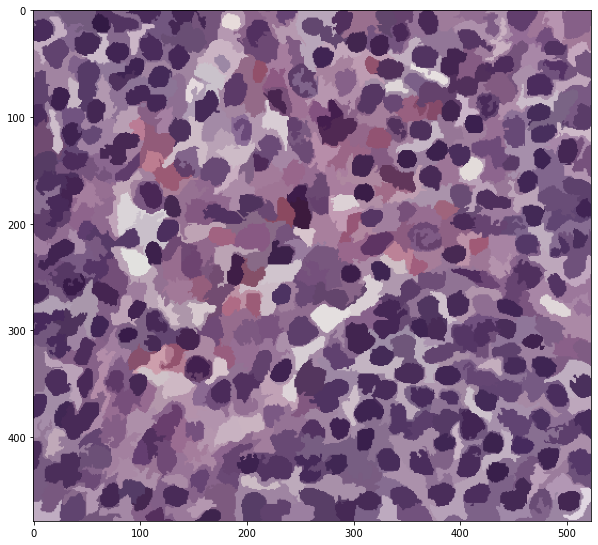

In [183]:
n=filter_kmeans_segmentation(array)
plt.figure(figsize=(10,10))
plt.imshow(n)

In [184]:
def filter_rag_threshold(np_img, compactness=10, n_segments=800, threshold=9):
  """
  Use K-means segmentation to segment RGB image, build region adjacency graph based on the segments, combine
  similar regions based on threshold value, and then output these resulting region segments.
  Args:
    np_img: Binary image as a NumPy array.
    compactness: Color proximity versus space proximity factor.
    n_segments: The number of segments.
    threshold: Threshold value for combining regions.
  Returns:
    NumPy array (uint8) representing 3-channel RGB image where each segment has been colored based on the average
    color for that segment (and similar segments have been combined).
  """
  t = Time()
  labels = sk_segmentation.slic(np_img, compactness=compactness, n_segments=n_segments)
  g = sk_future.graph.rag_mean_color(np_img, labels)
  labels2 = sk_future.graph.cut_threshold(labels, g, threshold)
  result = sk_color.label2rgb(labels2, np_img, kind='avg')
  np_info(result, "RAG Threshold", t.elapsed())
  return result

RAG Threshold        | Time: 0:00:02.828466  Type: uint8   Shape: (479, 523, 3)


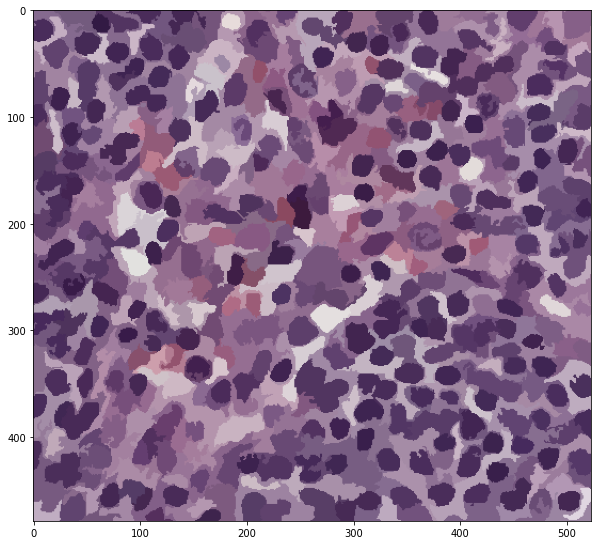

In [185]:
e=filter_rag_threshold(array)
plt.figure(figsize=(10,10))
plt.imshow(e)

In [186]:
def filter_threshold(np_img, threshold, output_type="bool"):
  """
  Return mask where a pixel has a value if it exceeds the threshold value.
  Args:
    np_img: Binary image as a NumPy array.
    threshold: The threshold value to exceed.
    output_type: Type of array to return (bool, float, or uint8).
  Returns:
    NumPy array representing a mask where a pixel has a value (T, 1.0, or 255) if the corresponding input array
    pixel exceeds the threshold value.
  """
  t = Time()
  result = (np_img > threshold)
  if output_type == "bool":
    pass
  elif output_type == "float":
    result = result.astype(float)
  else:
    result = result.astype("uint8") * 255
  np_info(result, "Threshold", t.elapsed())
  return result

Threshold            | Time: 0:00:00.000187  Type: bool    Shape: (479, 523)


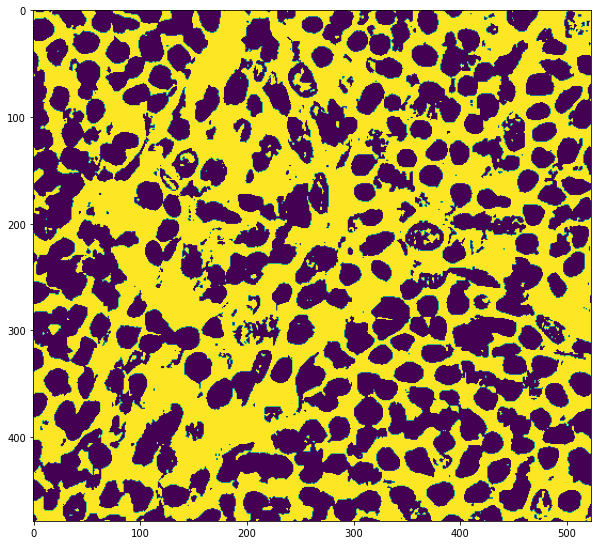

In [192]:
f=filter_threshold(b,100)
plt.figure(figsize=(10,10))
plt.imshow(f)

In [193]:
import argparse
import numpy as np
from PIL import Image


def normalizeStaining(img, saveFile=None, Io=240, alpha=1, beta=0.15):
    ''' Normalize staining appearence of H&E stained images
    
    Example use:
        see test.py
        
    Input:
        I: RGB input image
        Io: (optional) transmitted light intensity
        
    Output:
        Inorm: normalized image
        H: hematoxylin image
        E: eosin image
    
    Reference: 
        A method for normalizing histology slides for quantitative analysis. M.
        Macenko et al., ISBI 2009
    '''
             
    HERef = np.array([[0.5626, 0.2159],
                      [0.7201, 0.8012],
                      [0.4062, 0.5581]])
        
    maxCRef = np.array([1.9705, 1.0308])
    
    # define height and width of image
    h, w, c = img.shape
    
    # reshape image
    img = img.reshape((-1,3))

    # calculate optical density
    OD = -np.log((img.astype(np.float)+1)/Io)
    
    # remove transparent pixels
    ODhat = OD[~np.any(OD<beta, axis=1)]
        
    # compute eigenvectors
    eigvals, eigvecs = np.linalg.eigh(np.cov(ODhat.T))
    
    #eigvecs *= -1
    
    #project on the plane spanned by the eigenvectors corresponding to the two 
    # largest eigenvalues    
    That = ODhat.dot(eigvecs[:,1:3])
    
    phi = np.arctan2(That[:,1],That[:,0])
    
    minPhi = np.percentile(phi, alpha)
    maxPhi = np.percentile(phi, 100-alpha)
    
    vMin = eigvecs[:,1:3].dot(np.array([(np.cos(minPhi), np.sin(minPhi))]).T)
    vMax = eigvecs[:,1:3].dot(np.array([(np.cos(maxPhi), np.sin(maxPhi))]).T)
    
    # a heuristic to make the vector corresponding to hematoxylin first and the 
    # one corresponding to eosin second
    if vMin[0] > vMax[0]:
        HE = np.array((vMin[:,0], vMax[:,0])).T
    else:
        HE = np.array((vMax[:,0], vMin[:,0])).T
    
    # rows correspond to channels (RGB), columns to OD values
    Y = np.reshape(OD, (-1, 3)).T
    
    # determine concentrations of the individual stains
    C = np.linalg.lstsq(HE,Y, rcond=None)[0]
    
    # normalize stain concentrations
    maxC = np.array([np.percentile(C[0,:], 99), np.percentile(C[1,:],99)])
    tmp = np.divide(maxC,maxCRef)
    C2 = np.divide(C,tmp[:, np.newaxis])
    
    # recreate the image using reference mixing matrix
    Inorm = np.multiply(Io, np.exp(-HERef.dot(C2)))
    Inorm[Inorm>255] = 254
    Inorm = np.reshape(Inorm.T, (h, w, 3)).astype(np.uint8)  
    
    # unmix hematoxylin and eosin
    H = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,0], axis=1).dot(np.expand_dims(C2[0,:], axis=0))))
    H[H>255] = 254
    H = np.reshape(H.T, (h, w, 3)).astype(np.uint8)
    
    E = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,1], axis=1).dot(np.expand_dims(C2[1,:], axis=0))))
    E[E>255] = 254
    E = np.reshape(E.T, (h, w, 3)).astype(np.uint8)
    
    if saveFile is not None:
        Image.fromarray(Inorm).save(saveFile+'.png')
        Image.fromarray(H).save(saveFile+'_H.png')
        Image.fromarray(E).save(saveFile+'_E.png')

    return Inorm, H, E

In [194]:
img = np.array(Image.open('/content/2.png'))

In [201]:
img2 = np.array(Image.open('/content/output.png'))

In [199]:
img1 = np.array(Image.open('/content/output_H.png'))

In [203]:
img3 = np.array(Image.open('/content/output_E.png'))

In [ ]:
normalizeStaining(img = img,saveFile = 'output',Io = 240,alpha = 1,beta = 0.15)

Original Image



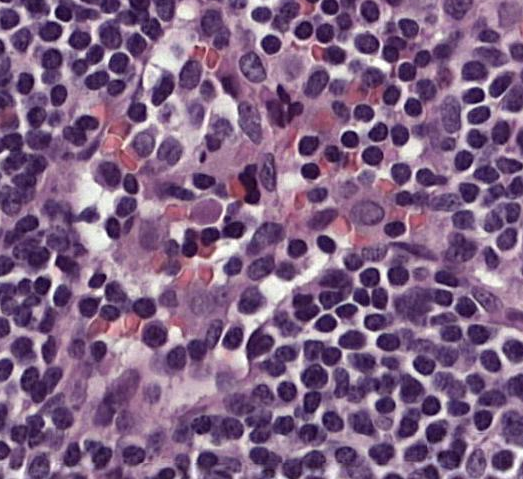


Normailized Image



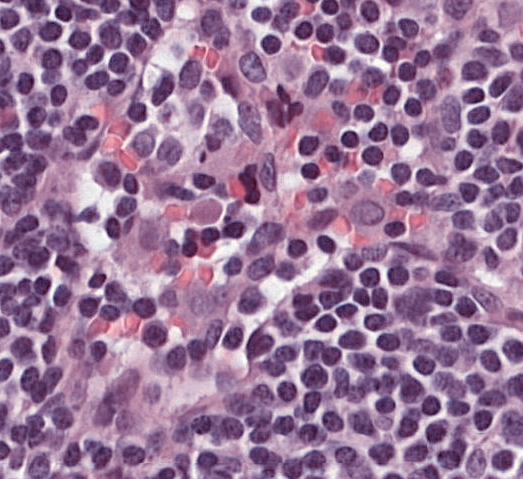


Haemotoxylin Image



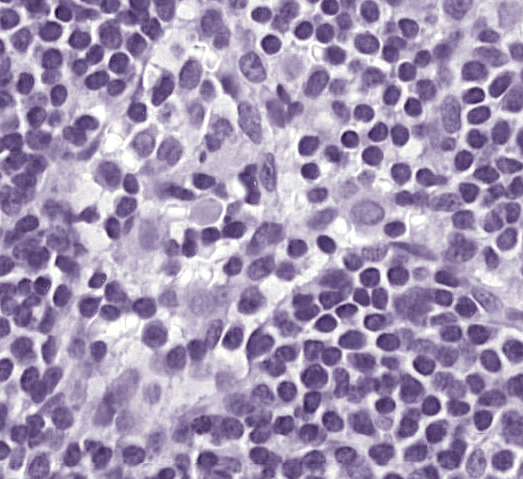


Eosin Image



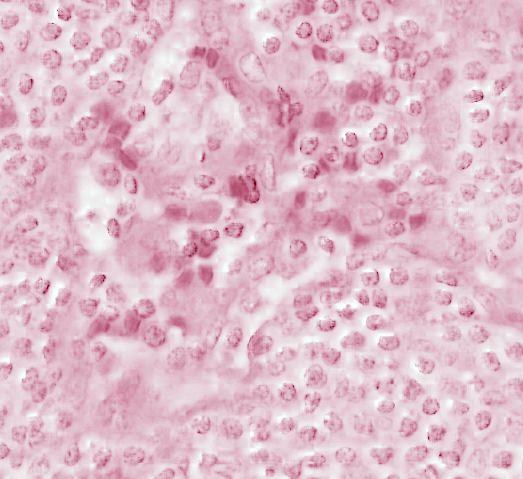

In [206]:
print("Original Image\n")
display(Image.fromarray(img))
print("\nNormailized Image\n")
display(Image.fromarray(img2))
print("\nHaemotoxylin Image\n")
display(Image.fromarray(img1))
print("\nEosin Image\n")
display(Image.fromarray(img3))

In [207]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
img = cv2.imread('/content/2.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

In [208]:
# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)

# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)

# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

In [209]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)

# Add one to all labels so that sure background is not 0, but 1
markers = markers+1

# Now, mark the region of unknown with zero
markers[unknown==255] = 0

In [214]:
markers = cv2.watershed(img,markers)
img[markers==50] = [0,255,255]

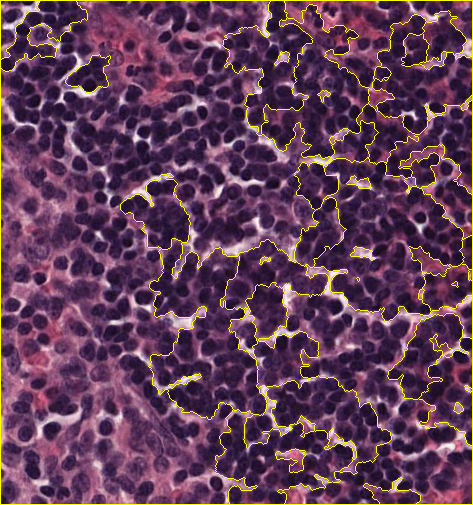

In [ ]:
cv2_imshow(img)

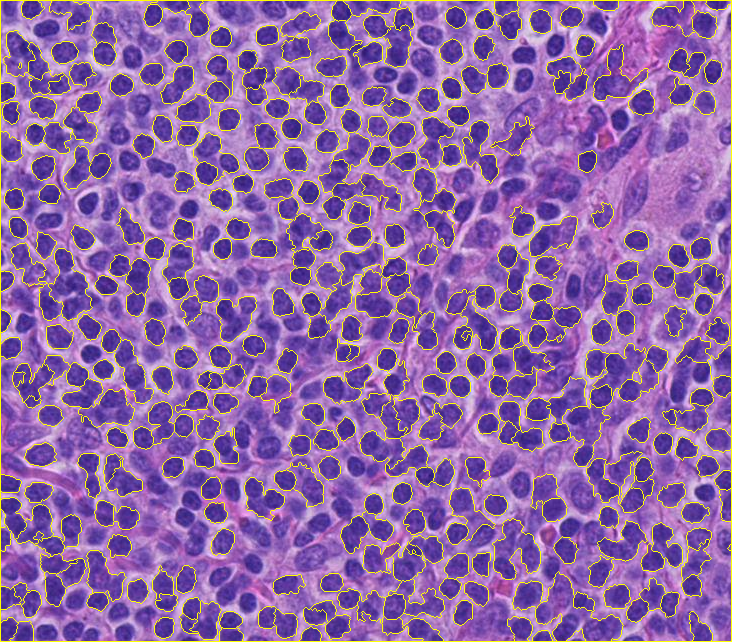

In [ ]:
cv2_imshow(img)